In [1]:
import matplotlib
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import ImageGrid
from matplotlib.pyplot import imsave
from tensorflow.examples.tutorials.mnist import input_data
%matplotlib inline

In [2]:
mnist = input_data.read_data_sets('MNIST_data', one_hot=True)
image_pixels = 28
kernel = 5

Successfully downloaded train-images-idx3-ubyte.gz 9912422 bytes.
Extracting MNIST_data/train-images-idx3-ubyte.gz
Successfully downloaded train-labels-idx1-ubyte.gz 28881 bytes.
Extracting MNIST_data/train-labels-idx1-ubyte.gz
Successfully downloaded t10k-images-idx3-ubyte.gz 1648877 bytes.
Extracting MNIST_data/t10k-images-idx3-ubyte.gz
Successfully downloaded t10k-labels-idx1-ubyte.gz 4542 bytes.
Extracting MNIST_data/t10k-labels-idx1-ubyte.gz


In [3]:
sess = tf.InteractiveSession()

In [4]:
def weight_initialise(shape):
    value = tf.truncated_normal(shape, stddev=0.1)
    return tf.Variable(value)

def bias_initialise(shape):
    value = tf.constant(0.1, shape=shape)
    return tf.Variable(value)


In [5]:
x = tf.placeholder(tf.float32, shape=[None, 784])
targets = tf.placeholder(tf.float32, shape=[None, 10])

In [6]:
#cnn
input_layer = tf.reshape(x, [-1, image_pixels, image_pixels, 1])

weights1 = weight_initialise([kernel, kernel, 1, 32])
bias1 = bias_initialise([32])
output1 = tf.nn.relu(tf.nn.conv2d(input_layer, weights1, strides=[1, 1, 1, 1], padding='SAME')+bias1)
pool1 = tf.nn.max_pool(output1, ksize=[1, 2, 2, 1], strides=[1, 2, 2, 1], padding='SAME')

weights2 = weight_initialise([kernel, kernel, 32, 64])
bias2 = bias_initialise([64])
output2 = tf.nn.relu(tf.nn.conv2d(pool1, weights2, strides=[1, 1, 1, 1], padding='SAME')+bias2)
pool2 = tf.nn.max_pool(output2, ksize=[1, 2, 2, 1], strides=[1, 2, 2, 1], padding='SAME')

weights_fc1 = weight_initialise([7*7*64, 1024])
bias_fc1 = bias_initialise([1024])

pool2_flat = tf.reshape(pool2, [-1, 7*7*64])

output_fc1 = tf.nn.relu(tf.matmul(pool2_flat, weights_fc1) + bias_fc1)

keep_prob = tf.placeholder(tf.float32)
dropout = tf.nn.dropout(output_fc1, keep_prob)

weights_fc2 = weight_initialise([1024, 10])
bias_fc2 = bias_initialise([10])
y_conv = tf.matmul(dropout, weights_fc2) + bias_fc2

In [7]:
y = tf.nn.softmax(y_conv)

In [8]:
# Loss and optimizer
cross_entropy = tf.nn.softmax_cross_entropy_with_logits(labels=targets, logits=y_conv)
cross_entropy = tf.reduce_mean(cross_entropy)
train = tf.train.AdamOptimizer(0.0001).minimize(cross_entropy)

In [9]:
correct_prediction = tf.equal(tf.argmax(y_conv,1), tf.argmax(targets,1))
accuracy = tf.reduce_mean(tf.cast(correct_prediction, tf.float32))

In [10]:
sess.run(tf.global_variables_initializer())

In [11]:
# Train model
for i in range(1000):
    batch_x, batch_y = mnist.train.next_batch(100)
    if i%200 == 0:
        train_accuracy = accuracy.eval(feed_dict={x:batch_x, targets: batch_y, keep_prob: 1.0})
        print("step %d, training accuracy %g"%(i, train_accuracy))

    train.run(feed_dict={x: batch_x, targets: batch_y, keep_prob: 0.5})

step 0, training accuracy 0.18
step 200, training accuracy 0.94
step 400, training accuracy 0.96
step 600, training accuracy 0.94
step 800, training accuracy 0.97


In [12]:
# Test model
print("test accuracy %g"%accuracy.eval(feed_dict={x: mnist.test.images[0:10000], 
                                                  targets: mnist.test.labels[0:10000], keep_prob: 1.0}))

test accuracy 0.9677


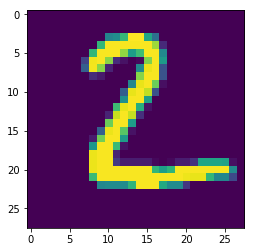

In [13]:
# original image
imageshow = mnist.test.images[1].reshape(28,28)
plt.imshow(imageshow)
plt.show()

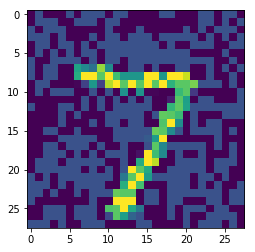

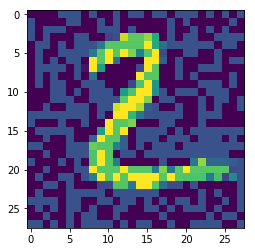

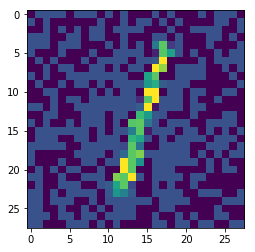

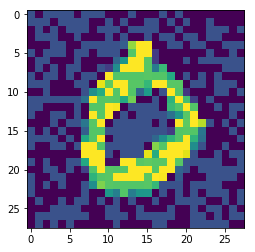

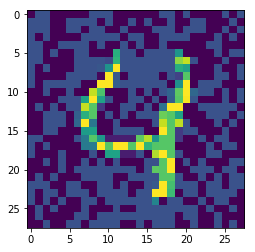

...

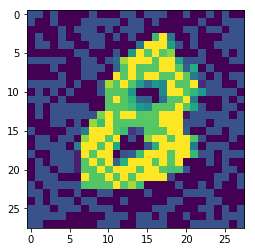

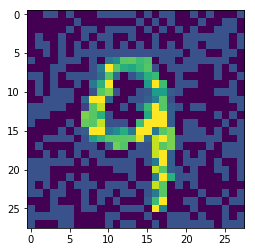

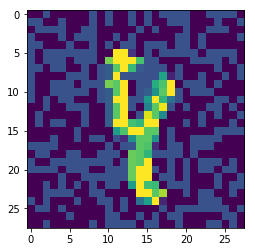

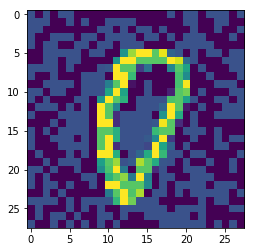

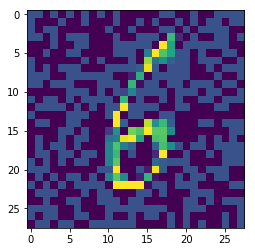

step 499 adv accuracy 0.038


In [14]:
#adversarial images for test set
for i in range(500):
    x_image = mnist.test.images[i]
    x_image= np.reshape(x_image, (1, 784))
    y_label=mnist.test.labels[i]
    
    original_image = x_image
    
    # Calculate loss, derivative and create adversarial image
    loss =  tf.nn.softmax_cross_entropy_with_logits(labels=y_label, logits=y_conv)
    grad = tf.gradients(loss, x)
    image_adv = x+tf.sign(grad)*0.25
    image_adv = tf.clip_by_value(image_adv, 0, 1) 
 
    x_adv = sess.run(image_adv, {x: x_image, keep_prob: 1.0})
        
    mnist.test.images[i]= np.reshape(x_adv, (1, 784)) 

    # adversarial image
    imageshow = mnist.test.images[i].reshape(28,28)
    plt.imshow(imageshow)
    plt.show()
        
print("step %d adv accuracy %g"%(i,accuracy.eval(feed_dict={x: mnist.test.images[0:500], targets: mnist.test.labels[0:500], keep_prob: 1.0})))


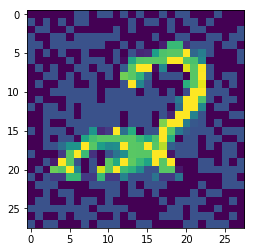

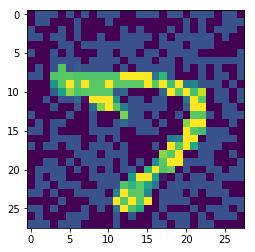

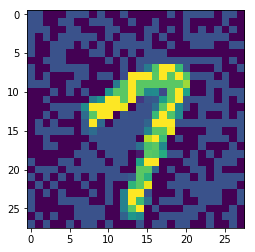

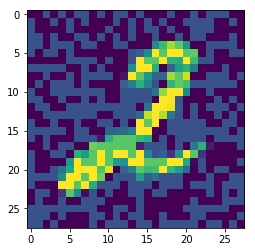

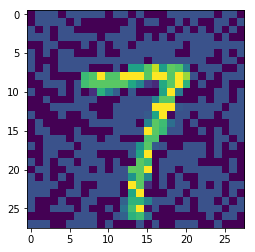

...

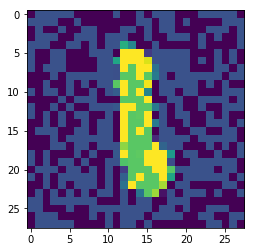

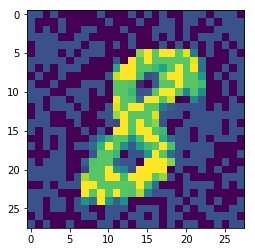

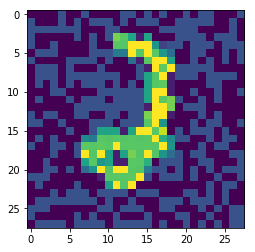

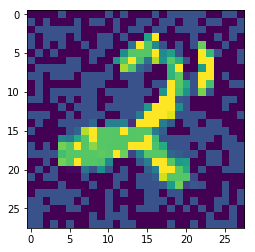

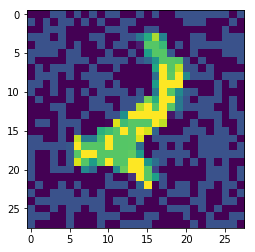

In [15]:
#adversarial images for train set
for i in range(500):
    x_image = mnist.train.images[i]
    x_image= np.reshape(x_image, (1, 784))
    y_label=mnist.train.labels[i]
    
    original_image = x_image
    
    # Calculate loss, derivative and create adversarial image
    loss =  tf.nn.softmax_cross_entropy_with_logits(labels=y_label, logits=y_conv)
    grad = tf.gradients(loss, x)
    image_adv = x+tf.sign(grad)*0.25
    image_adv = tf.clip_by_value(image_adv, 0, 1) 
 
    x_adv = sess.run(image_adv, {x: x_image, keep_prob: 1.0})
        
    mnist.train.images[i]= np.reshape(x_adv, (1, 784)) 
    
     # adversarial image
    i
    imageshow = mnist.train.images[i].reshape(28,28)
    plt.imshow(imageshow)
    plt.show()


In [16]:
# Train model on adversarial train images
for i in range(1000):
    batch_x, batch_y = mnist.train.next_batch(100)
    if i%200 == 0:
        train_accuracy = accuracy.eval(feed_dict={x:batch_x, targets: batch_y, keep_prob: 1.0})
        print("step %d, training accuracy %g"%(i, train_accuracy))

    train.run(feed_dict={x: batch_x, targets: batch_y, keep_prob: 0.5})

step 0, training accuracy 0.98
step 200, training accuracy 0.96
step 400, training accuracy 0.94
step 600, training accuracy 0.96
step 800, training accuracy 0.94


In [17]:
# Test model on adversarial test images
print("test accuracy %g"%accuracy.eval(feed_dict={x: mnist.test.images[0:500], targets: mnist.test.labels[0:500], keep_prob: 1.0}))

test accuracy 0.316


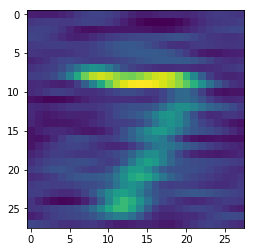

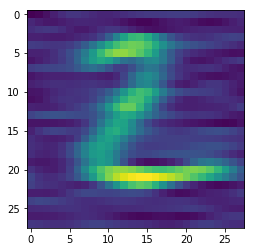

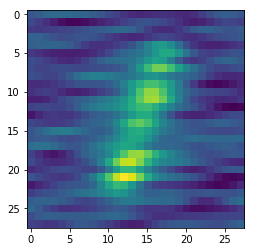

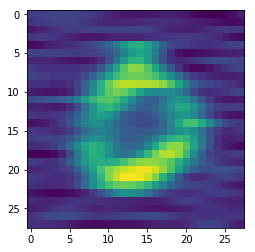

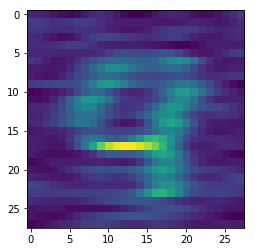

...

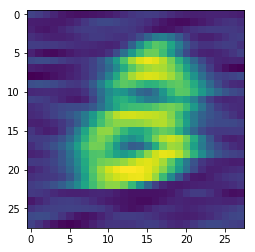

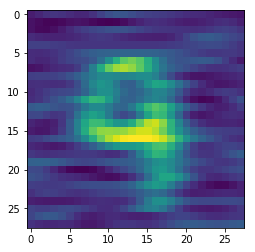

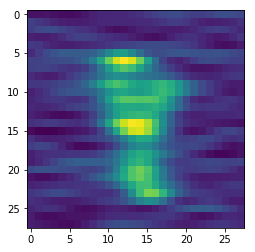

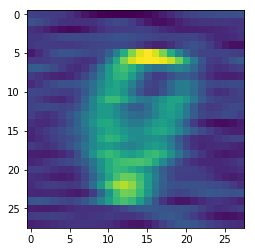

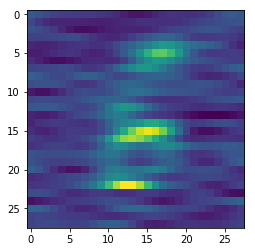

step 499 adv accuracy 0.524


In [18]:
from scipy import ndimage
#blurring adversarial images for test set
for i in range(500):
    mnist.test.images[i]= np.reshape(mnist.test.images[i], (1, 784))
    mnist.test.images[i] = ndimage.gaussian_filter(mnist.test.images[i], sigma=2)
    mnist.test.images[i]= np.reshape(mnist.test.images[i], (1, 784)) 

    # blurred adversarial image
    imageshow = mnist.test.images[i].reshape(28,28)
    plt.imshow(imageshow)
    plt.show()
        
print("step %d adv accuracy %g"%(i,accuracy.eval(feed_dict={x: mnist.test.images[0:500], targets: mnist.test.labels[0:500], keep_prob: 1.0})))
